In this report I try to estimate how x-ray radiation from a synchrotron source affects boar sperm cells when exposed during a tomography scan. 

# Technical Report 
## Radiation Damage to Sperm in a Synchrotron
### 10-5-2021, Mette Bjerg Lindhøj

## Experiment
We did a setup where we mounted the camera microscope above a Ø 3.5 cm petri dish. We put 1 mL of pure sample in the beam. The beam was 8 mm wide and 4 mm high and approximately at the center of the dish. The same bottle of sperm cells labelled was used during the whole experiment. The bottle was gently turned a couple of times before the sample was taken to distribute the cells well. During exposure the petridish was turned on a rotation stage. The volume of cells was fully exposed in the vertical direction, but given the width of the beam compared to the width of the dish all the cells were not constantly exposed in the lateral direction. This also implies that the cells at the center of rotation were receiving a higher dose than those towards the edges of the dish, as the cells in the center would be constantly exposed. 

Above the dish we mounted a microscope camera to get a visual on the movement on the cells.

Total cell count prior to experiment: 20.14 mil

## Video overview
We did 5 videos at exposure time 1,5,10,15 and 45 minutes. From the videos we clipped a start sequence, ie. a sequence before exposure, and an end sequence, i.e. a sequence after exposure. 

The following dataframe shows the clipping time of the videos, their names and corresponding exposure time

In [1]:
import pandas as pd
import os
from scipy.optimize import curve_fit
from scipy.stats import linregress
import matplotlib 
import matplotlib.pyplot as plt
from IPython.display import Video
from skimage import filters
dataPath = "./data/"
import pickle

font = {'family' : 'normal',
        'size'   : 14}

matplotlib.rc('font', **font)

df = pd.read_csv(os.path.join(dataPath, "data.csv"))
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]
df

,video,dead,minutes,s1,s2,e1,e2
0,ID002.webm,1.1770,45,63.8,72.0,2827.51,2838.51
1,ID003.webm,0.2970,15,63.8,73.0,1017.49,1028.49
2,ID004.webm,0.1760,1,16.0,27.0,116.00,132.00
3,ID005.webm,0.2750,5,25.0,36.0,368.67,379.67
4,ID006.webm,0.4565,10,15.0,26.0,661.80,672.80


video is the name of the original video. The column "dead" contains the average number of dead cells counted with a cell counter. The column "minutes" contains the exposure times. s1, s2 denote from, to seconds for clipping the original video to get the start clip before exposure. e1 and e2 are like s1 and s2 but for the end clip after exposure. The clips were saved in the data folder and _s is appended for start sequences, _e is appended for end sequences. See example below where start and end clips are shown for the 15 minute exposure video.

In [2]:

Video(os.path.join(dataPath,"ID002_s.webm"), embed=True)

The bright dots are the cells, and it is clear that there is a lot of movement.

In [3]:
Video(os.path.join(dataPath,"ID002_e.webm"), embed=True)

The amount of movement has decreased a lot after the 15 minutes exposure, but it seems like the video contains some "flickering" globally.

Let us first load videos and sort them in order of increasing exposure

In [4]:
import numpy as np
filenames_start = np.array([item for item in np.sort(os.listdir(dataPath)) if item.endswith("_s.webm")])
filenames_end = np.array([item for item in np.sort(os.listdir(dataPath)) if item.endswith("_e.webm")])

# sort by increasing exposure
sort_order = np.argsort(df['minutes'].values)[:]
filenames_start_sorted = filenames_start[sort_order]
filenames_end_sorted = filenames_end[sort_order]
minutes = df['minutes'].values[sort_order]
minutes, filenames_start_sorted,filenames_end_sorted

(array([ 1,  5, 10, 15, 45]),
 array(['ID004_s.webm', 'ID005_s.webm', 'ID006_s.webm', 'ID003_s.webm',
        'ID002_s.webm'], dtype='<U12'),
 array(['ID004_e.webm', 'ID005_e.webm', 'ID006_e.webm', 'ID003_e.webm',
        'ID002_e.webm'], dtype='<U12'))

Let us look at the viability results from the cell counter.

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


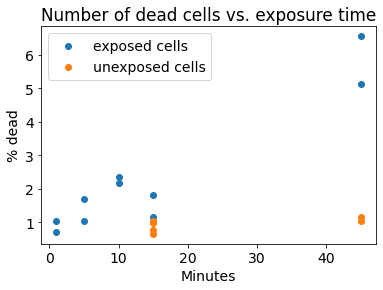

In [5]:

dead = df['dead'].values[sort_order]
unexposed_minutes = [15, 15, 15, 15, 45, 45]
dead_non_exposed = (np.array([0.154,0.209,0.132, 0.198, 0.231,0.209])/20.14)*100
plt.title("Number of dead cells vs. exposure time")
plt.xlabel("Minutes")
plt.ylabel("% dead")
#plt.axhline(y=1.0, label="accuracy", color="r", linestyle="--")
minutes_doubles = [1,1,5,5,10,10,15,15,45,45]
dead_doubles = (np.array([0.143,0.209,0.341,0.209,0.440,0.473,0.231,0.363,1.320,1.034])/20.14)*100
plt.scatter(minutes_doubles, dead_doubles, label="exposed cells")
plt.scatter(unexposed_minutes, dead_non_exposed, label="unexposed cells")
#plt.scatter(minutes, dead)
#plt.scatter(unexposed_minutes, dead_non_exposed)

plt.legend()
plt.savefig("dead.png", dpi=300, bbox_inches='tight')

Nothing really shows up before 45 minutes. Instead let us look at the videos and if we can see an effect on the movement.

In [6]:
from utils import *
import matplotlib.pyplot as plt
frames_start_sorted = get_sliced_movie(filenames_start_sorted, 100)#101 is the most we can do
frames_end_sorted = get_sliced_movie(filenames_end_sorted, 100)
videos, frames, height, width, channels = frames_start_sorted.shape

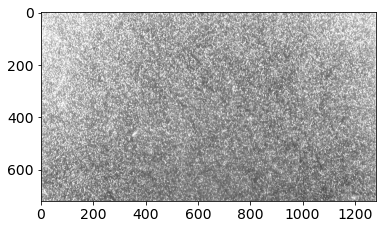

In [7]:
plt.imshow(frames_start_sorted[0,0,:,:,2], cmap="gray")

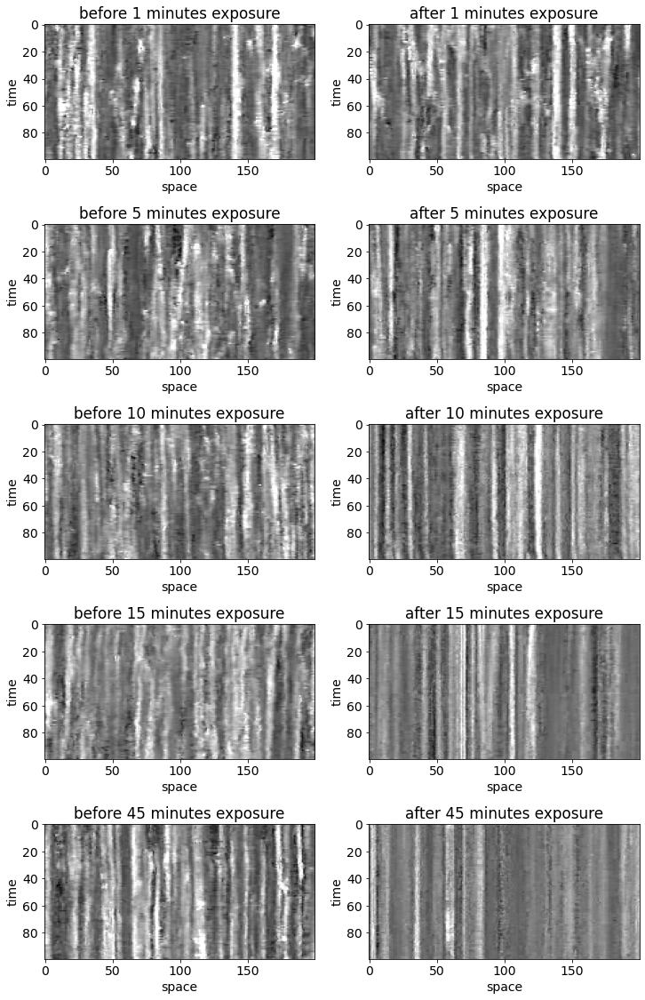

In [8]:
fig,ax = plt.subplots(5, 2, figsize=(12,20))

for v in range(5):
    img1 = frames_start_sorted[v,:,300:500,400,2]
    img2 = frames_end_sorted[v,:,300:500,400,2]
    ax[v,0].imshow(img1, cmap="gray")
    ax[v,0].set_title(f"before {minutes[v]} minutes exposure")
    ax[v,0].set_ylabel("time")
    ax[v,0].set_xlabel("space")
    ax[v,1].imshow(img2, cmap="gray")
    ax[v,1].set_title(f"after {minutes[v]} minutes exposure")
    ax[v,1].set_ylabel("time")
    ax[v,1].set_xlabel("space")
    
plt.savefig("rawdata.png", dpi=300, bbox_inches='tight')

In [9]:
N = height*width

temporal_entropy_1 = np.zeros((videos,N))
temporal_entropy_2 = np.zeros((videos,N))
with open(r"temporal_entropy_1_trans.pickle", "rb") as input_file:
    temporal_entropy_1 = pickle.load(input_file)
with open(r"temporal_entropy_2_trans.pickle", "rb") as input_file:
    temporal_entropy_2 = pickle.load(input_file)

f = frames
#for v in tqdm(range(videos)):
#    img1 = frames_start_sorted[v,:,:,:,2].reshape((f,N))
#    img2 = frames_end_sorted[v,:,:,:,2].reshape((f,N))
#    entr_img1 = filters.rank.entropy(rescale(img1), np.ones((f, 1)))[int(f/2),:]
#    entr_img2 = filters.rank.entropy(rescale(img2), np.ones((f, 1)))[int(f/2),:]
#    temporal_entropy_1[v]=entr_img1
#    temporal_entropy_2[v]=entr_img2

In [10]:
#pickle.dump(temporal_entropy_1,open("temporal_entropy_1_trans.pickle", "wb"))
#pickle.dump(temporal_entropy_2,open("temporal_entropy_2_trans.pickle", "wb"))

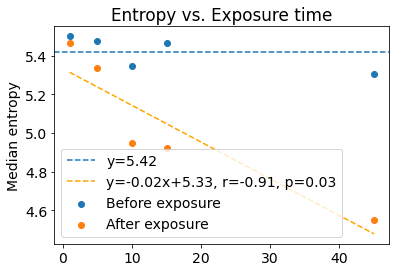

In [11]:
x = minutes
median_start = np.median(temporal_entropy_1, axis=1)
median_end = np.median(temporal_entropy_2, axis=1)

median_val_start = np.median(temporal_entropy_1)
plt.axhline(y=median_val_start, color='#1f77b4', linestyle='--', label=f"y={median_val_start:.2f}")
#ax[0].axhline(y=np.median(entropy_2), color='r', linestyle='--', label="mean entropy before exposure")
plt.scatter(x,np.median(temporal_entropy_1, axis=1), label="Before exposure")
#ax[0].plot(x,median_end, label="median entropy values after exposure")
plt.scatter(x,np.median(temporal_entropy_2, axis=1), label="After exposure")

gradient, intercept, r_value, p_value, std_err = linregress(x,median_end)
mn=np.min(x)
mx=np.max(x)
x1=np.linspace(mn,mx,500)
y1=gradient*x1+intercept
#plt.plot(x,y,'ob')
plt.plot(x1,y1,color='orange', linestyle='--', label=f'y={gradient:.2f}x+{intercept:.2f}, r={r_value:.2f}, p={p_value:.2f}')
#ax[0].fill_between(x, confidence_before[:,0], confidence_before[:,1], color="#1f77b4", alpha=0.5)
#ax[0].fill_between(x, confidence_after[:,0], confidence_after[:,1], color="orange", alpha=0.5)
plt.legend(loc='lower left')
plt.title("Entropy vs. Exposure time")
plt.ylabel("Median entropy")


plt.savefig("entropy.png")

It seems that the images are more alike after exposure and that uniformity increases with exposure time.

Let's look at correlation between all frames

100%|██████████| 5/5 [00:08<00:00,  1.60s/it]


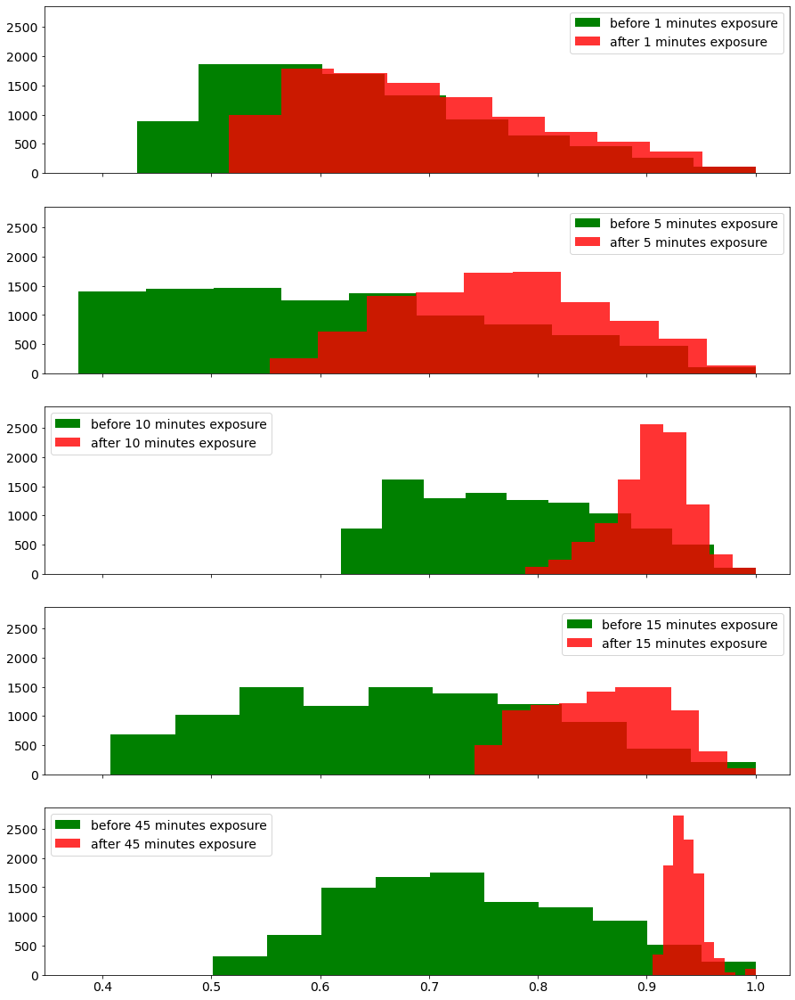

In [12]:
fig, ax = plt.subplots(5,1, figsize=(15,20), sharex=True, sharey=True)

corr1= np.zeros((5,f*f))
corr2= np.zeros((5,f*f))
for v in tqdm(range(5)):
    X1 = frames_start_sorted[v,:,:,:,2].reshape(f,N)
    X2 = frames_end_sorted[v,:,:,:,2].reshape(f,N)
    cor1 = np.corrcoef(X1, rowvar=True)
    cor2 = np.corrcoef(X2, rowvar=True)
    ax[v].hist(cor1.flatten(), color="green", label=f"before {minutes[v]} minutes exposure")
    ax[v].hist(cor2.flatten(), color="red", label=f"after {minutes[v]} minutes exposure", alpha = 0.8)
    ax[v].legend()
    #stat, pval = stats.mannwhitneyu(cor1.flatten(), cor2.flatten())
    #ax[v].set_title(f"")
    corr1[v] = cor1.flatten()
    corr2[v] = cor2.flatten()
    
plt.savefig("correlation.png")

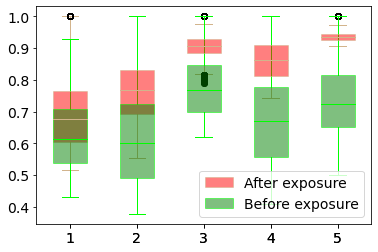

In [13]:
fig, ax = plt.subplots()
def box_plot(data, edge_color, fill_color):
    bp = ax.boxplot(data, patch_artist=True)
    
    for element in ['boxes', 'whiskers', 'fliers', 'means', 'medians', 'caps']:
        plt.setp(bp[element], color=edge_color)

    for patch in bp['boxes']:
        patch.set(facecolor=fill_color, alpha=0.5)       
        
    return bp
    
example_data1 = [[1,2,0.8], [0.5,2,2], [3,2,1]]
example_data2 = [[5,3, 4], [6,4,3,8], [6,4,9]]

bp1 = box_plot(corr2.T, 'tan', 'red')
bp2 = box_plot(corr1.T, 'lime', 'green')
ax.legend([bp1["boxes"][0], bp2["boxes"][0]], ['After exposure', 'Before exposure'])

plt.savefig("correlation_box.png", dpi=300, bbox_inches='tight')